<h1 align="center">Mathematical Methods In Engineering - 25872</h1>
<h4 align="center">Dr. Amiri</h4>
<h4 align="center">Sharif University of Technology, Fall 2023</h4>
<h4 align="center">Python Assignment 3</h4>
<h5 align="center"><font color="cyan"> Feel free to contact TA team for any possible questions about the assignment </font>
 </h5>
<h5 align="center"> <font color="cyan"> Questions 1,2: @mh_momeni  -  Question 2,3: @Mahdi_h721 </font> </h5>


You should write your code in the <font color='green'>Code Cell</font> and then run the <font color='green'>Evaluation Cell</font> to check the correctness of your code.<br>
<font color='red'>**Please do not edit the codes in the Evaluation Cells.**</font>

##  Q1. Implementing QR Factorization <sub><sup>``(40 pt.)``</sup></sub>

>In this question, we are going to use QR factorization in computing eigenvalues. It is an important building block in numerical linear algebra. Recall that for any matrix $A$
, $A=QR$
 where $Q$
 is orthogonal and $R$
 is upper-triangular.

 **Reminder**: The QR algorithm, uses the QR decomposition, but don't confuse the two.

In [49]:
import numpy as np
np.set_printoptions(suppress=True, precision=4)

In [50]:
n = 5
A = np.random.rand(n,n)
npQ, npR = np.linalg.qr(A)

Check that Q is orthogonal:


In [51]:
np.allclose(np.eye(n), npQ @ npQ.T), np.allclose(np.eye(n), npQ.T @ npQ)

(True, True)

Check that R is triangular

In [52]:
npR

array([[-1.0992, -1.4184, -1.2262, -0.9858, -1.3305],
       [ 0.    ,  1.0724,  0.988 ,  0.4665,  0.5294],
       [ 0.    ,  0.    ,  0.4844,  0.2673,  0.2698],
       [ 0.    ,  0.    ,  0.    ,  0.1035, -0.0274],
       [ 0.    ,  0.    ,  0.    ,  0.    ,  0.2724]])

### Gram-Schmidt

#### Classical Gram-Schmidt (unstable)

For each $j$
, calculate a single projection

$$v_j=P_ja_j$$

where $P_j$
 projects onto the space orthogonal to the span of $q_1,…,q_{j−1}$
.

In [146]:
def cgs(A):
  m, n = A.shape
  Q = np.zeros([m,n], dtype=np.float64)
  R = np.zeros([n,n], dtype=np.float64)
    ##Your Code start here

  for k in range(A.shape[1]):
      temp = A[:, k]
      for j in range(k):
          R[j, k] = np.dot(Q[:, j], A[:, k])
          temp = temp - R[j, k] * Q[:, j]

      R[k, k] = np.linalg.norm(temp)
      Q[:, k] = temp / R[k,k]
    ##Your Code ends here
  return Q, R


In [54]:
Q, R = cgs(A)
np.allclose(A, Q @ R)

True

Check if Q is unitary:

In [55]:
np.allclose(np.eye(len(Q)), Q.dot(Q.T))

True

### Modified Gram-Schmidt (optional)

Classical (unstable) Gram-Schmidt: for each $j$
, calculate a single projection
$$v_j=P_ja_j$$
where $P_j$
 projects onto the space orthogonal to the span of $q_1,…,q_{j−1}$
.

Modified Gram-Schmidt: for each $j$
, calculate $j−1$
 projections
$$P_j=P_{⊥q_{j−1}⋯⊥q_2⊥q_1}$$

In [ ]:
n = 3
A = np.random.rand(n,n).astype(np.float64)

In [57]:
def mgs(A):

    V = A.copy()
    m, n = A.shape
    Q = np.zeros([m,n], dtype=np.float64)
    R = np.zeros([n,n], dtype=np.float64)
    ##Your Code start here
    for k in range(A.shape[1]):
        for j in range(k):
            R[j, k] = np.dot(Q[:, j], V[:,k])
            V[:,k] = V[:,k] - R[j, k] * Q[:, j]

        R[k, k] = np.linalg.norm(V[:,k])
        Q[:, k] = V[:,k] / R[k, k]

    ##Your Code ends here
    return Q, R


In [58]:
Q, R = mgs(A)
np.allclose(np.eye(len(Q)), Q.dot(Q.T.conj()))

True

In [59]:
np.allclose(A, np.matmul(Q,R))

True

### Classical vs Modified Gram-Schmidt

In this part, we want to construct a square matrix $A$ with random singular vectors and widely varying singular values spaced by factors of 2 between $2^{−1}$
 and $2^{−(n+1)}$

In [60]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

In [61]:
n = 100
U, X = np.linalg.qr(np.random.randn(n,n))   # set U to a random orthogonal matrix
V, X = np.linalg.qr(np.random.randn(n,n))   # set V to a random orthogonal matrix
S = np.diag(np.power(2,np.arange(-1,-(n+1),-1), dtype=float))  # Set S to a diagonal matrix w/ exp
                                                              # values between 2^-1 and 2^-(n+1)

In [62]:
A = np.matmul(U,np.matmul(S,V))
QC, RC = cgs(A)
QM, RM = mgs(A) # if you don't complete the mgs function, comment this line

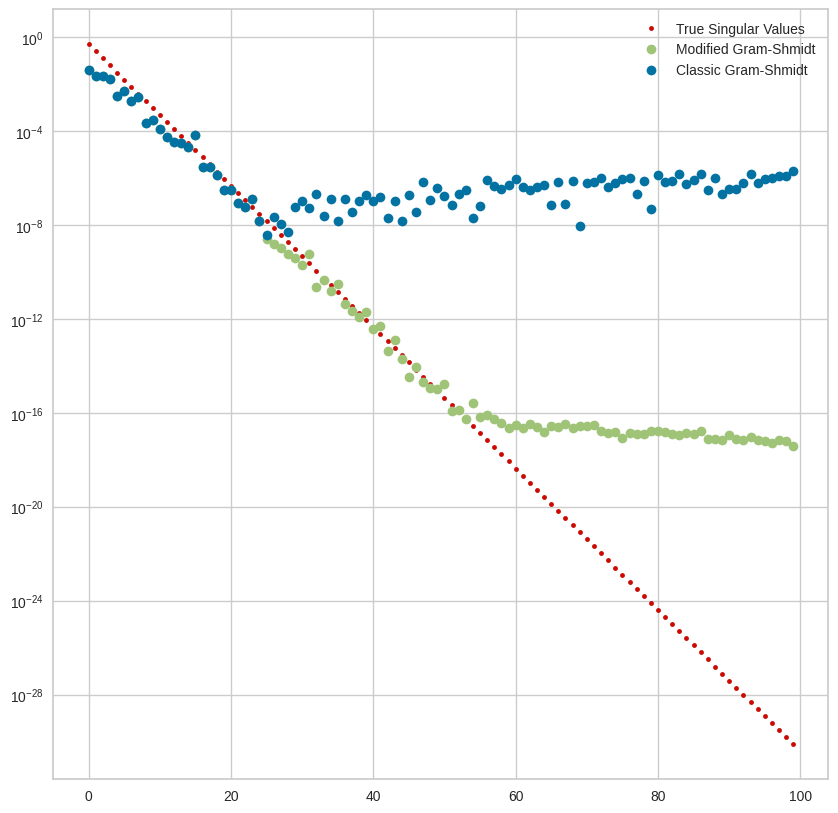

In [63]:
plt.figure(figsize=(10,10))
plt.semilogy(np.diag(S), 'r.', label="True Singular Values")
plt.semilogy(np.diag(RM), 'go', label="Modified Gram-Shmidt")
plt.semilogy(np.diag(RC), 'b.', label="Classic Gram-Shmidt")
plt.legend()
rcParams.update({'font.size': 18})

### Eigenvalue Decomposition using QR Factorization

Use the QR algorithm (or QR method) to get the eigenvalues of matrix $A$. Do 100 iterations, and print out the 1st, 5th, 10th, 20th and 100th iteration.

 **Reminder**: The QR algorithm (or QR method), uses the QR factorization, but don't confuse the two.

In [ ]:
##Your Code start here
def eigenvalue_QR(A , iterations = 100):
    V = np.copy(A)
    n = A.shape[0]
    array = [1,5,10,20]
    exists = 2 in array
    for k in range(iterations):
        Q, R = cgs(V)
        V = R @ Q
        # we "peek" into the structure of matrix A from time to time
        # to see how it looks
        exists = k in array
        if exists :
            eigenvalues = np.zeros((n , 1))
            for i in range(n):
                eigenvalues[i] = V[i][i]
            eigenvalues = np.sort(eigenvalues , axis = 0)
            print("iteration" , k , ":")

            print(eigenvalues.T)
##Your Code ends here

In [ ]:
A = np.array([1.0, -1.0, 0.0, 0.0, -1.0, 1.0, -1.0, 0.0, 0.0, -1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 3.0]).reshape((4, 4))
print("The matrix: \n", A)

print("\n --- Built-in ---")
print(np.linalg.eig(A)[0])
##Your Code start here
eigenvalue_QR(A)
##Your Code ends here

The matrix: 
 [[ 1. -1.  0.  0.]
 [-1.  1. -1.  0.]
 [ 0. -1.  2.  0.]
 [ 0.  0.  0.  3.]]

 --- Built-in ---
[-0.247   1.445   2.8019  3.    ]
iteration 1 :
[[-0.2414  1.7969  2.4444  3.    ]]
iteration 5 :
[[-0.247   1.4475  2.7995  3.    ]]
iteration 10 :
[[-0.247   1.445   2.8019  3.    ]]
iteration 20 :
[[-0.247   1.445   2.8019  3.    ]]


##  Q2. SVD & Image processing <sub><sup>``(30 pt.)``</sup></sub>

> In this question, we are going to investigate the use of SVD as a tool to obtain the basis of the matrix in digital image processing.
The first issue we will examine is image compression. For this purpose, in general, we can consider the information inside the image as a data matrix, then find a suitable basis for this information matrix and by depicting the primary matrix on the more important basis vectors and keeping the necessary information to show the initial image with less information.
This process results in image compression. It should be noted that for simplicity, the images we are examining in this exercise are in black and white.
>With the help of SVD, we can find a basis for the column space of the image matrix that we want, so that the columns of the image matrix have the highest correlation with the basis vectors.
>On the other hand, if these bases are considered in descending order of the size of the singular values, they will contain the most general information of the columns of the image, so by keeping only r initial columns of the found bases (U) along with the combined vectors (V) and the singular values (Σ) corresponding to them, we can retain the image's overall image with a good approximation.
>From an expert point of view, the reconstruction is actually a lower-order reconstruction of the primary matrix.
In this view, the value of r is the parameter to control the amount of compression we want.

###  part 1

In this part, the compression operation is performed on the input black and white image with the help of SVD analysis. One of the criteria for comparing the initial and final image is the PSNR criterion. Research about this criterion and draw the PSNR diagram in terms of different r. Then compare the results with the diagram by giving some test inputs and plotting the outputs.
One of the inputs you give to the function should be the image pic.jpg.

In [87]:
from matplotlib.image import imread
import matplotlib.pyplot as plt
import numpy as np
import os
import math
import cv2

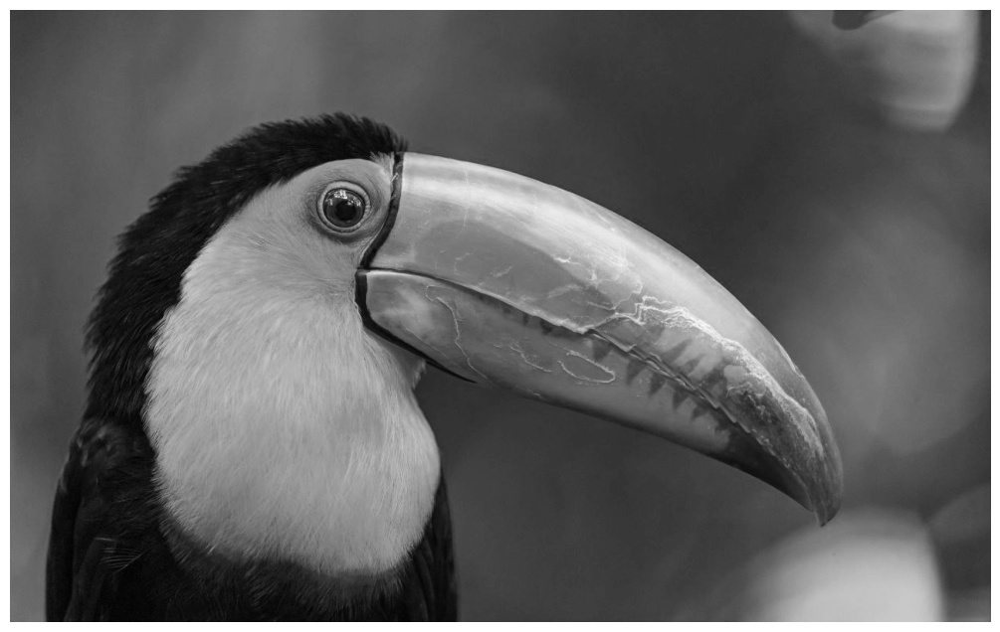

(800, 1280)


In [89]:
##Your Code start here
plt.rcParams['figure.figsize'] = [16, 8]
A = imread('pic.jpg')
X = np.mean(A, -1); # Convert RGB to grayscale
img = plt.imshow(X)
img.set_cmap('gray')
plt.axis('off')
plt.show()
print(X.shape)
##Your Code ends here

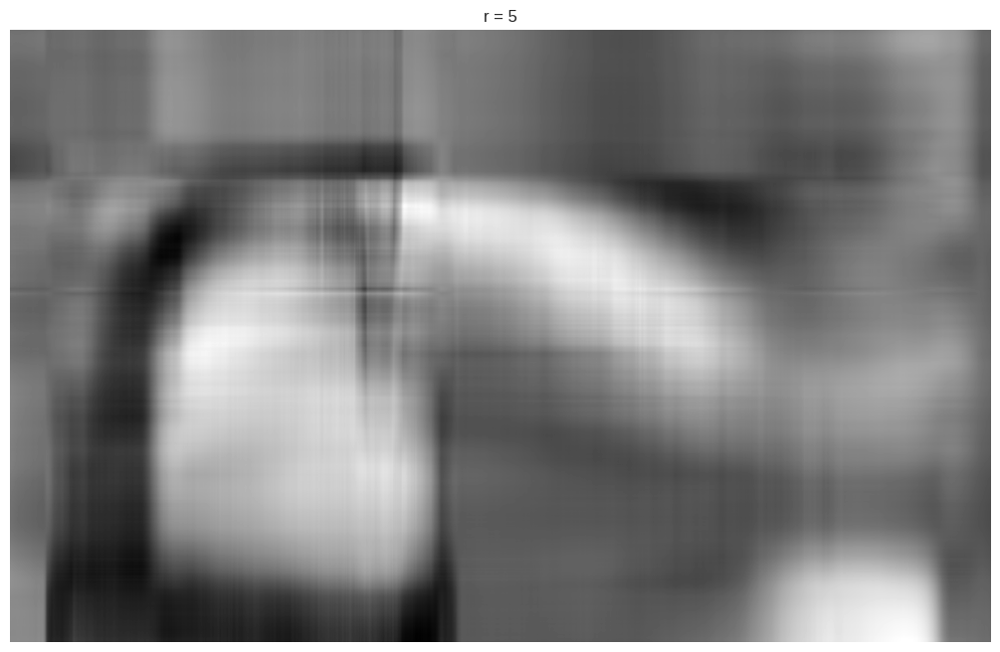

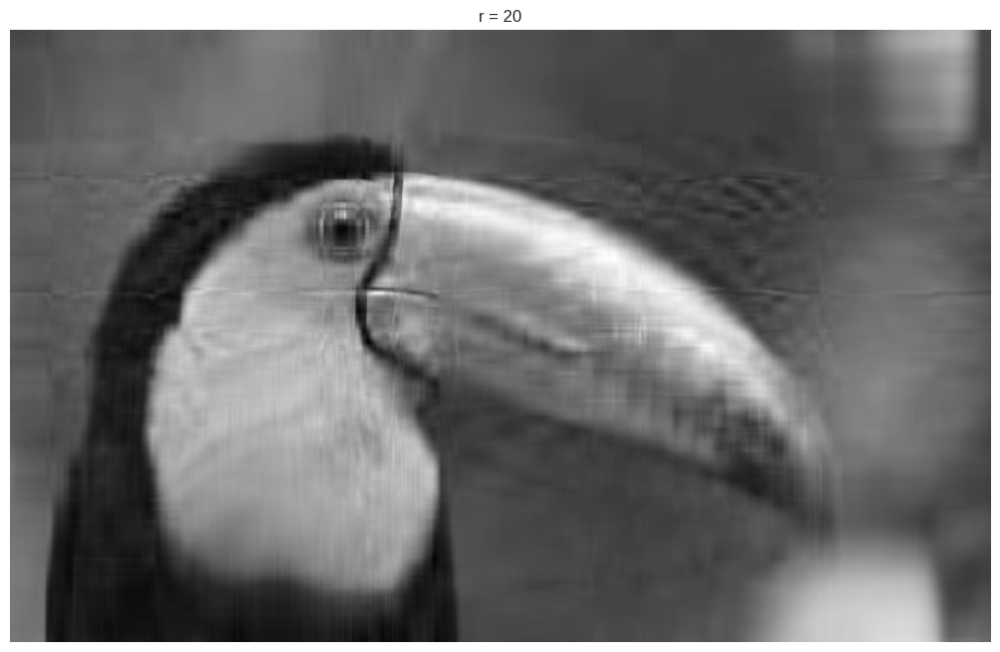

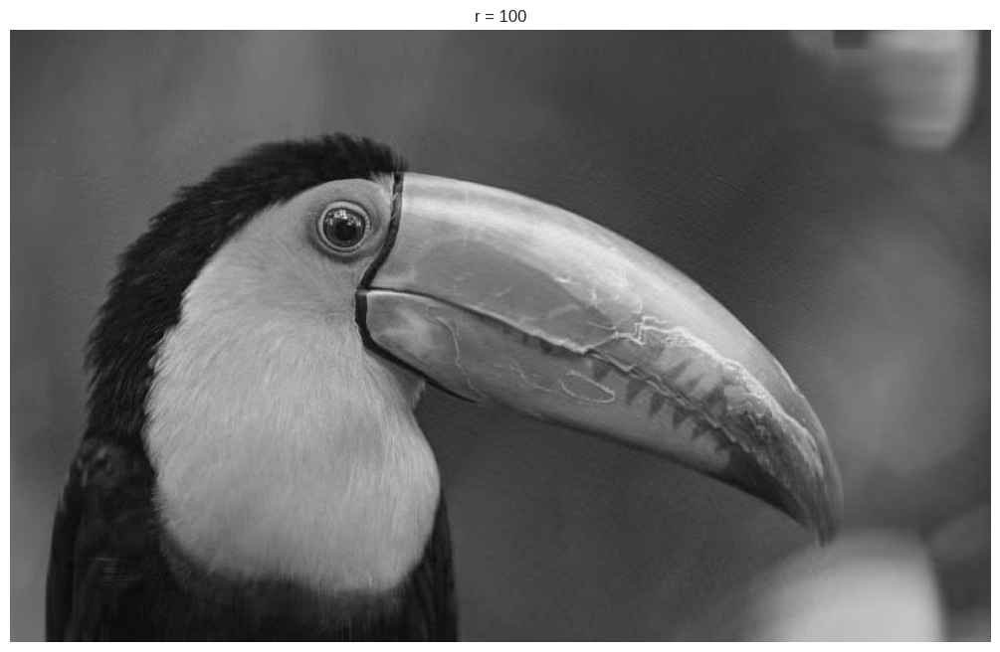

In [92]:
U, S, VT = np.linalg.svd(X,full_matrices=False)
S = np.diag(S)

j = 0
for r in (5, 20, 100):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()

In [93]:
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

In [96]:
psnr = []
for r in range(5 , 100 , 5):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    psnr.append(PSNR(X , Xapprox))

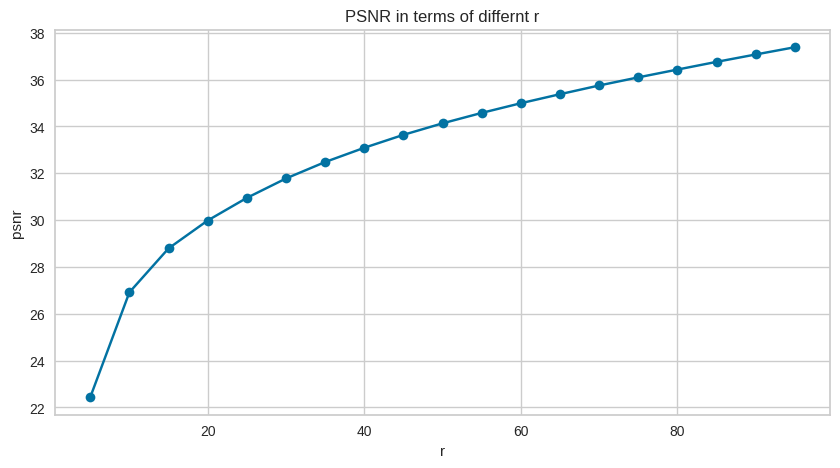

In [97]:
plt.figure(figsize=(10,5))
plt.plot(range(5 , 100 , 5) , psnr , marker = 'o')
plt.xlabel('r')
plt.ylabel('psnr')
plt.title('PSNR in terms of differnt r')
plt.show()

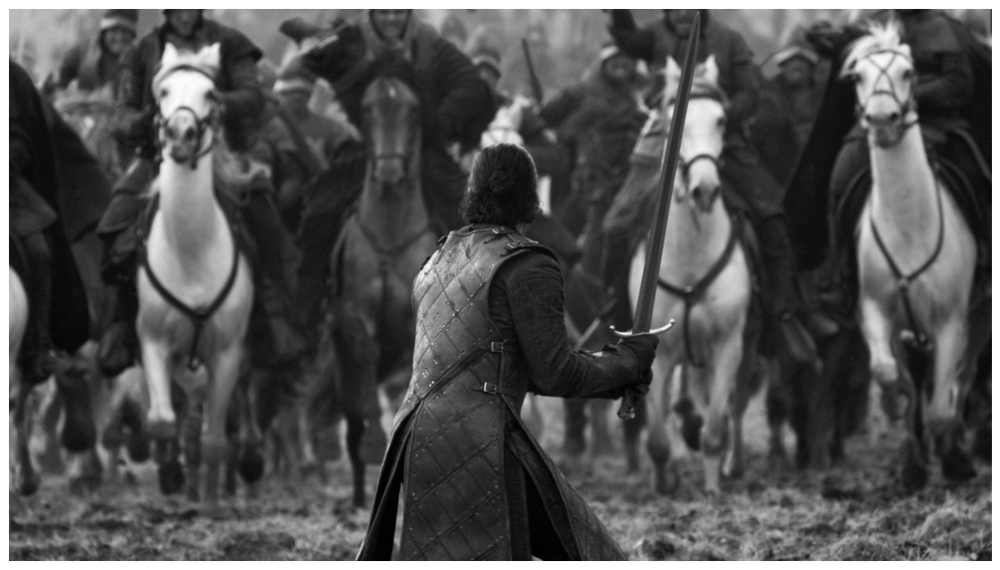

(1181, 2100)


In [98]:
plt.rcParams['figure.figsize'] = [16, 8]
A = imread('pxfuel.jpg')
X = np.mean(A, -1); # Convert RGB to grayscale
img = plt.imshow(X)
img.set_cmap('gray')
plt.axis('off')
plt.show()
print(X.shape)

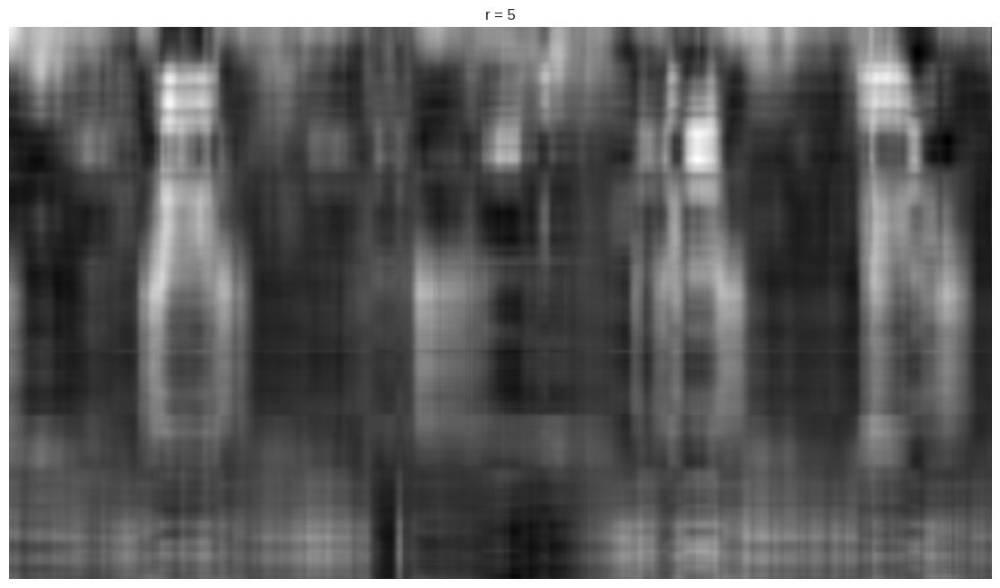

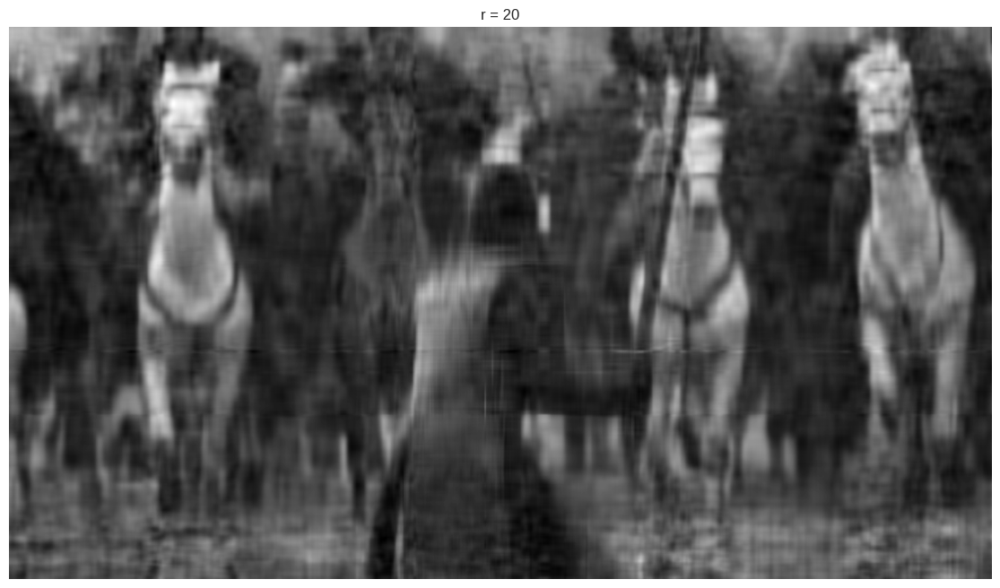

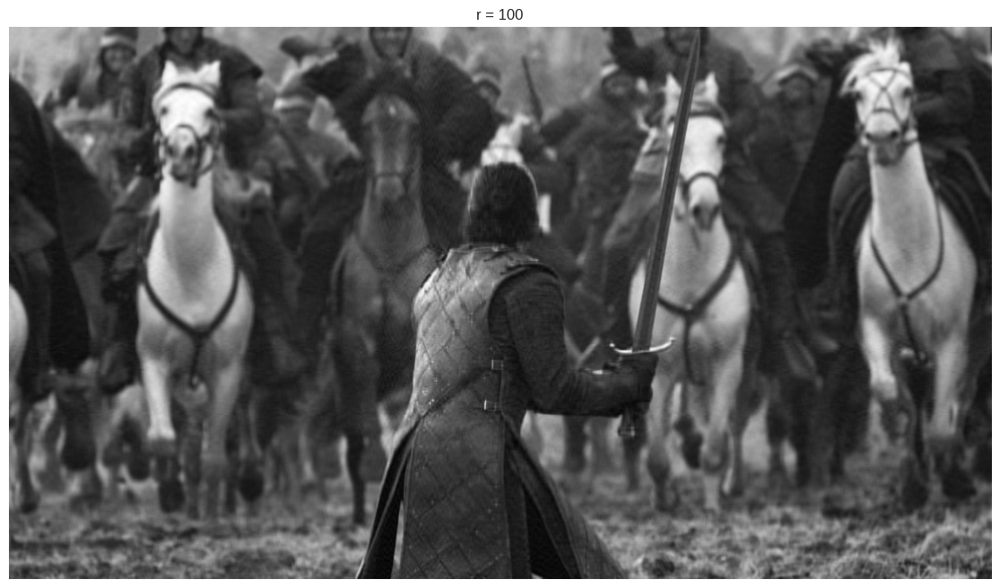

In [99]:
U, S, VT = np.linalg.svd(X,full_matrices=False)
S = np.diag(S)

j = 0
for r in (5, 20, 100):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()

In [100]:
psnr = []
for r in range(5 , 100 , 5):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    psnr.append(PSNR(X , Xapprox))

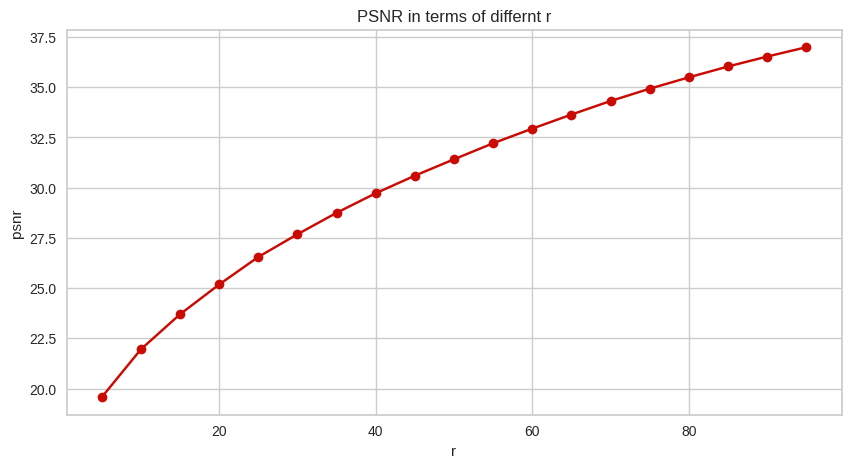

In [102]:
plt.figure(figsize=(10,5))
plt.plot(range(5 , 100 , 5) , psnr , color = 'r', marker = 'o')
plt.xlabel('r')
plt.ylabel('psnr')
plt.title('PSNR in terms of differnt r')
plt.show()

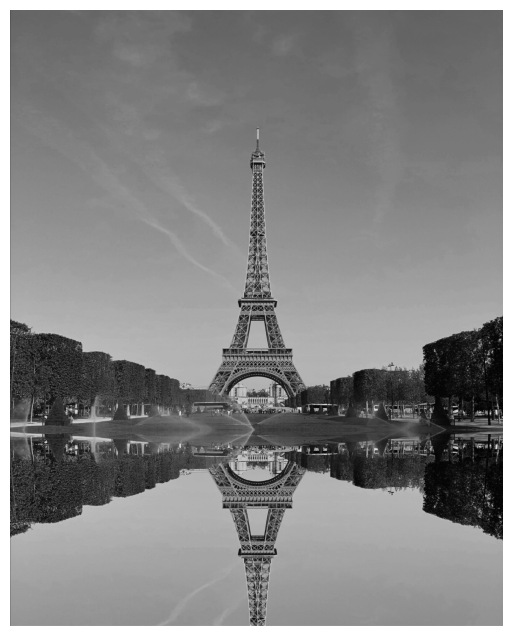

(3781, 3025)


In [103]:
plt.rcParams['figure.figsize'] = [16, 8]
A = imread('eiffel.jpg')
X = np.mean(A, -1); # Convert RGB to grayscale
img = plt.imshow(X)
img.set_cmap('gray')
plt.axis('off')
plt.show()
print(X.shape)

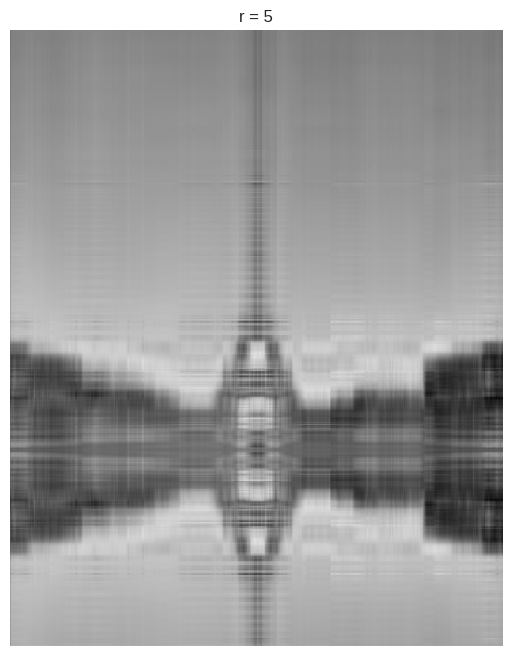

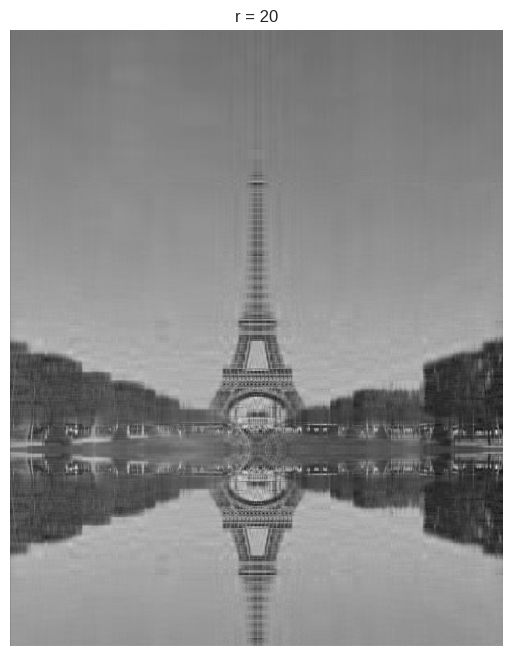

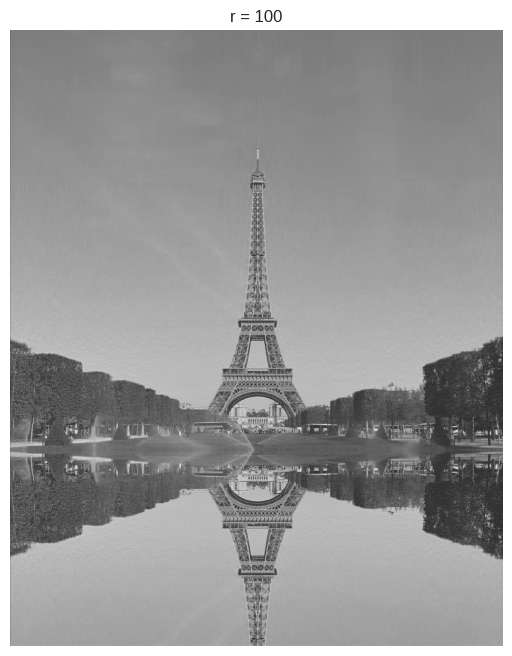

In [104]:
U, S, VT = np.linalg.svd(X,full_matrices=False)
S = np.diag(S)

j = 0
for r in (5, 20, 100):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()

In [105]:
psnr = []
for r in range(5 , 100 , 5):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    psnr.append(PSNR(X , Xapprox))

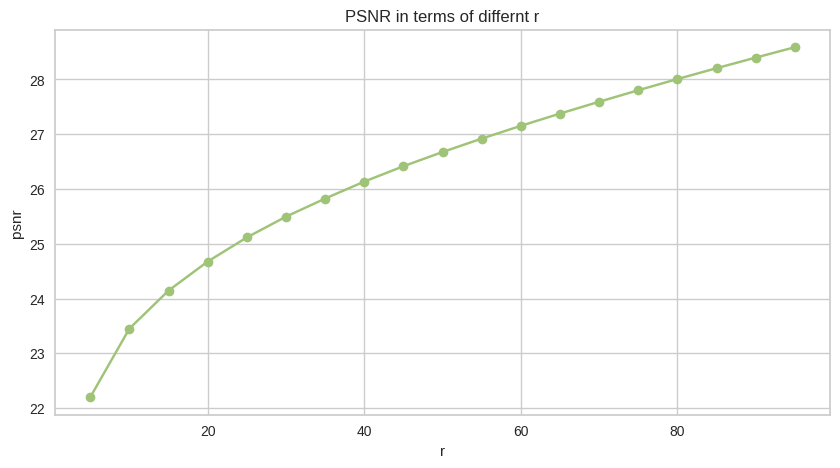

In [107]:
plt.figure(figsize=(10,5))
plt.plot(range(5 , 100 , 5) , psnr , color = 'g' , marker = 'o')
plt.xlabel('r')
plt.ylabel('psnr')
plt.title('PSNR in terms of differnt r')
plt.show()

###  part 2

Another issue that we can explore with a similar idea of applying base transform is removing noise from images. In the condition that the noise in the image is uniform and in such a way that it does not distort the general information in the image. from the point of view of SVD, according to the examination of the general information, the direction of the image vector on bases with larger singular values has not changed much, and removing the information related to Examining general information to vectors with less importance can remove noise and keep the main information of the image.
In this part, add two different noises salt and pepper and Gaussian noise with a desired and appropriate range to the image pic.jpg so that the PSNR of both images is in the same range, then perform the noise reduction process with the help of SVD analysis.
For both noises, draw the PSNR diagram in terms of different r.
  Then compare the results with the graph by plotting a number of outputs.
  Which of the noises is more effective in this method?


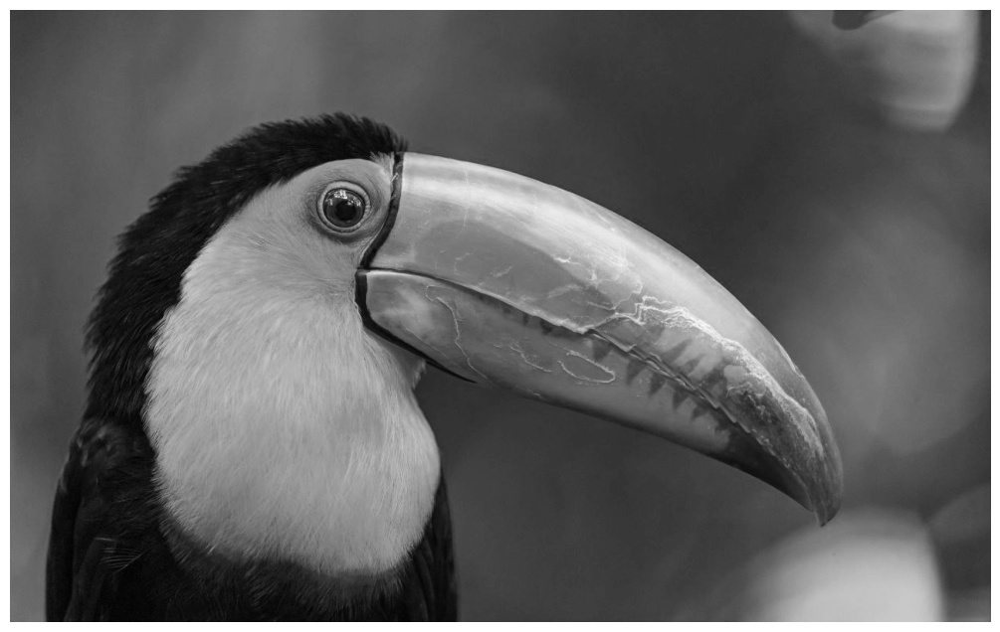

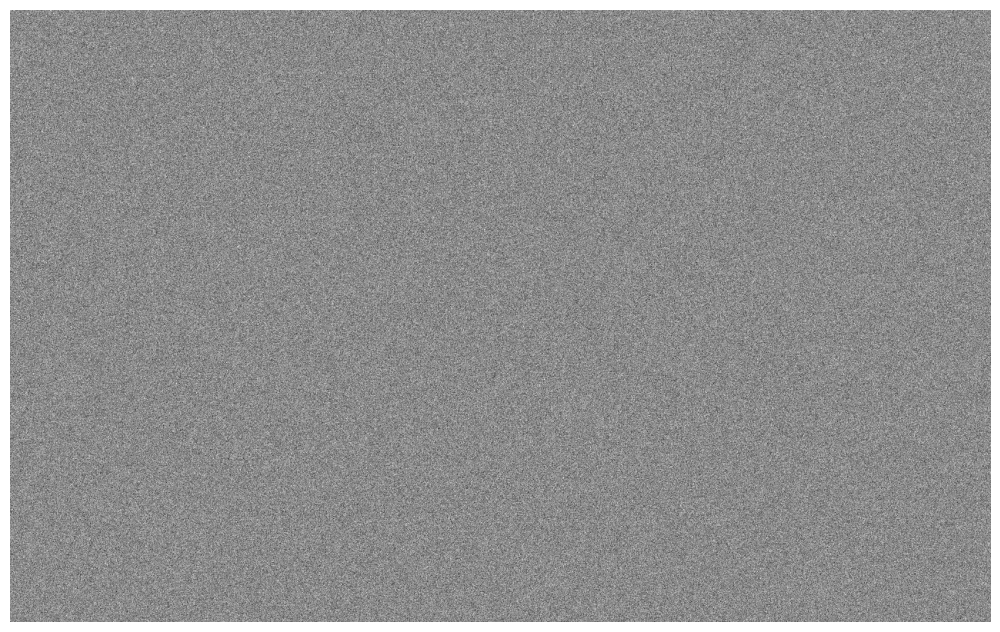

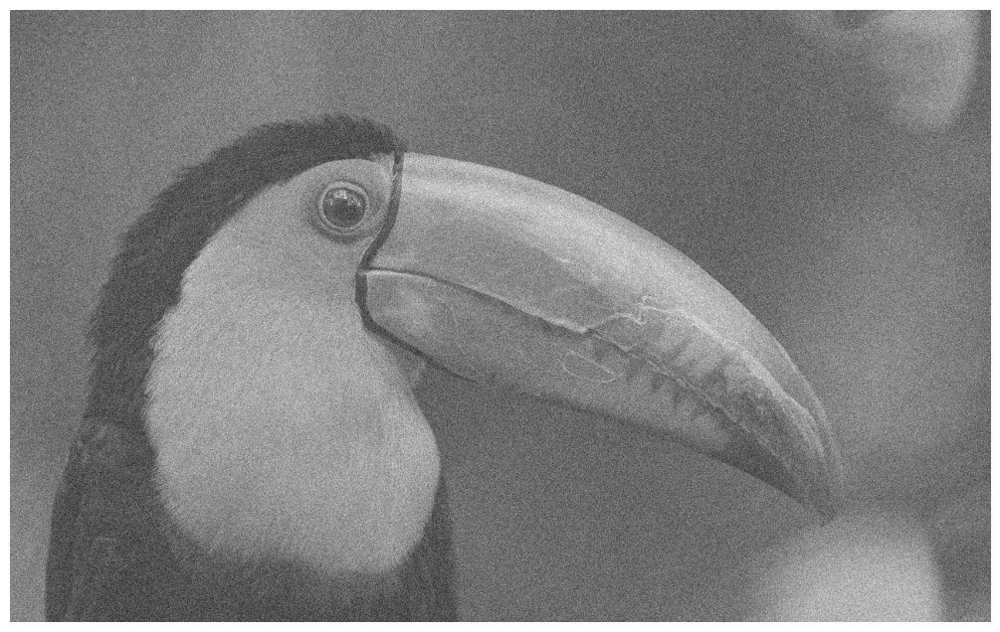

18.12357012987597


In [108]:
##Your Code start here
#adding gaussian noise
plt.rcParams['figure.figsize'] = [16, 8]
A = imread('pic.jpg')
X = np.mean(A, -1); # Convert RGB to grayscale
img = plt.imshow(X)
img.set_cmap('gray')
plt.axis('off')
plt.show()
x , y = X.shape
mean = 0
var = 1000
sigma  = np.sqrt(var)
n = np.random.normal(loc = mean,scale = sigma , size = (x , y))
img_n = plt.imshow(n)
img_n.set_cmap('gray')
plt.axis('off')
plt.show()

noisy_image_gause = X + n

img_2 = plt.imshow(noisy_image_gause)
img_2.set_cmap('gray')
plt.axis('off')
plt.show()

print(PSNR(X , noisy_image_gause))
##Your Code ends here

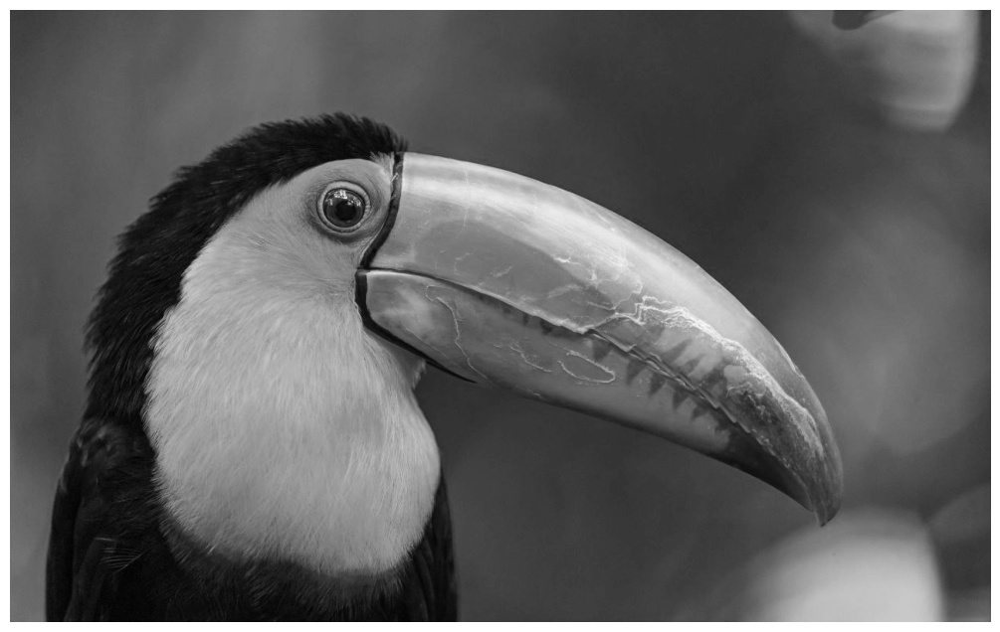

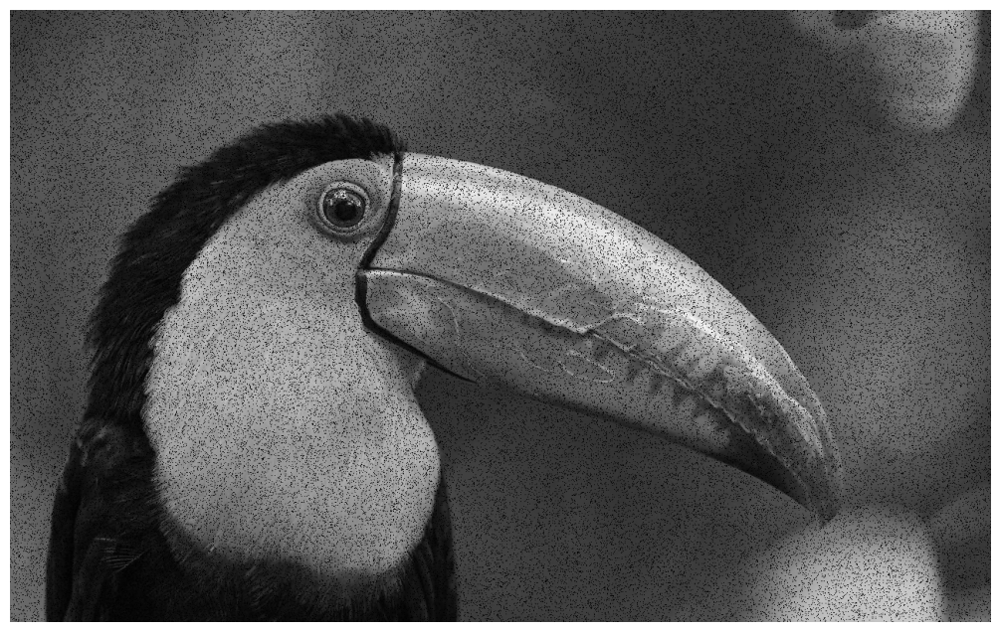

18.183468524055794


In [109]:
#adding sault and pepper noise
noisy_image_sp = np.zeros((x , y) , dtype = np.float32)
pepper = 0.05
salt = 1 - pepper
for i in range(x):
    for j in range(y):
        rand = np.random.random()
        if rand < pepper :
            noisy_image_sp[i][j] = 0
        elif rand > salt :
            noisy_image_sp[i][j] = 1
        else:
            noisy_image_sp[i][j] = X[i][j]
img = plt.imshow(X)
img.set_cmap('gray')
plt.axis('off')
plt.show()
img_3 = plt.imshow(noisy_image_sp)
img_3.set_cmap('gray')
plt.axis('off')
plt.show()
print(PSNR(X , noisy_image_sp))

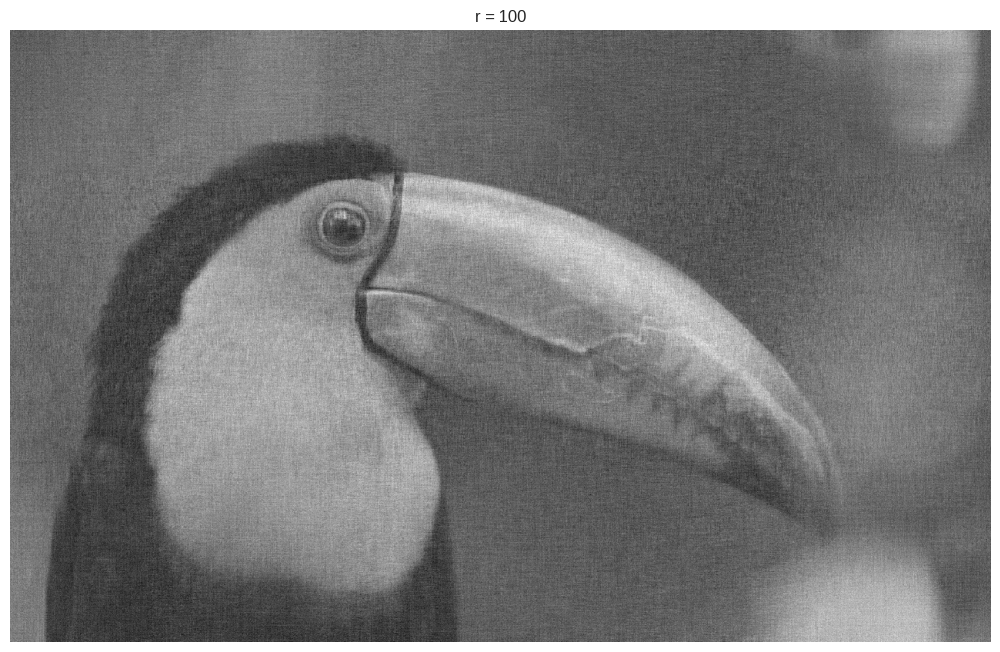

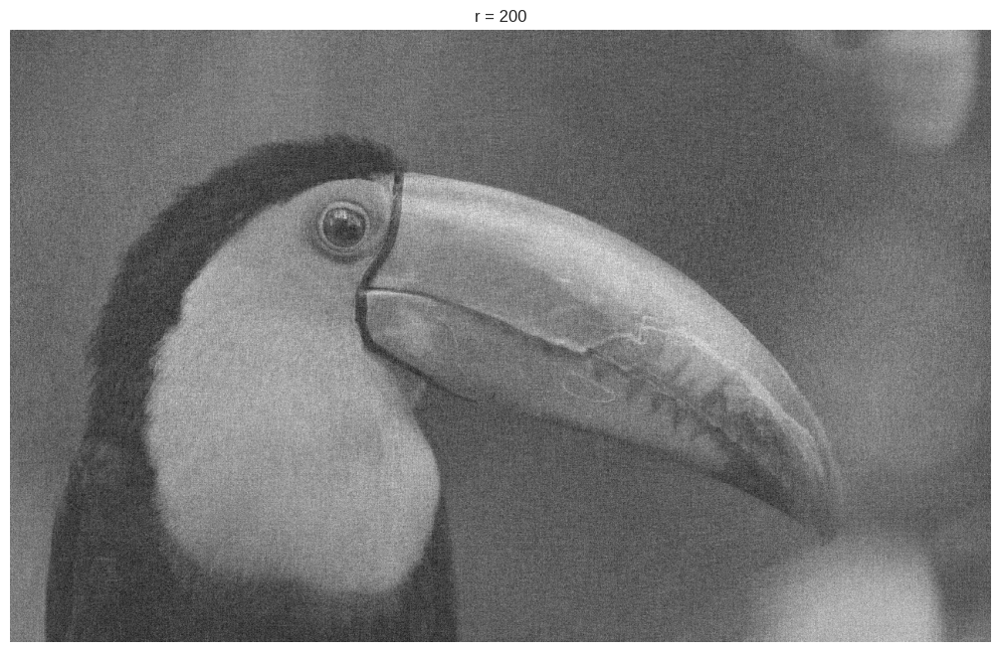

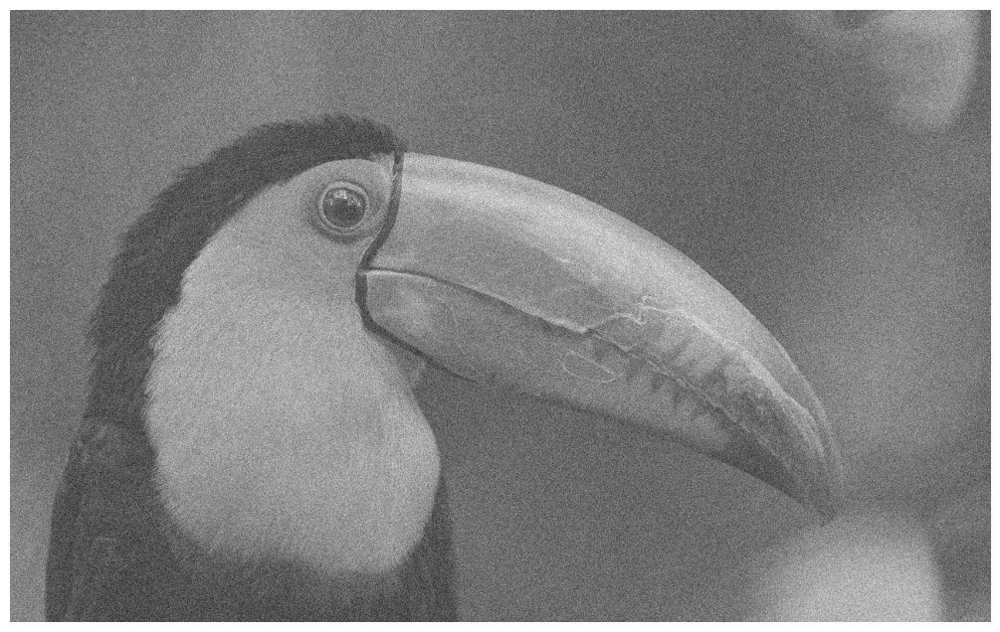

In [110]:
#removing gaussian noise
U, S, VT = np.linalg.svd(noisy_image_gause,full_matrices=False)
S = np.diag(S)

j = 0
for r in (100 , 200):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()
img_2 = plt.imshow(noisy_image_gause)
img_2.set_cmap('gray')
plt.axis('off')
plt.show()

In [128]:
psnr = []
for r in range(5 , 100 , 5):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    psnr.append(PSNR(X , Xapprox))

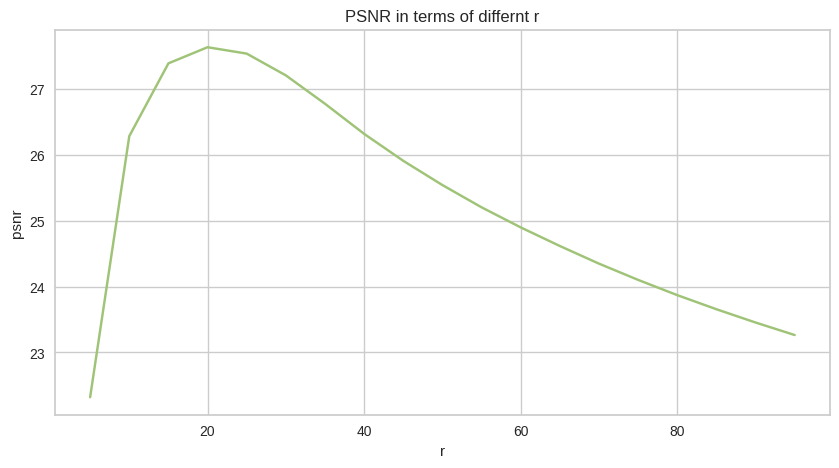

In [129]:
plt.figure(figsize=(10,5))
plt.plot(range(5 , 100 , 5) , psnr , color = 'g')
plt.xlabel('r')
plt.ylabel('psnr')
plt.title('PSNR in terms of differnt r')
plt.show()

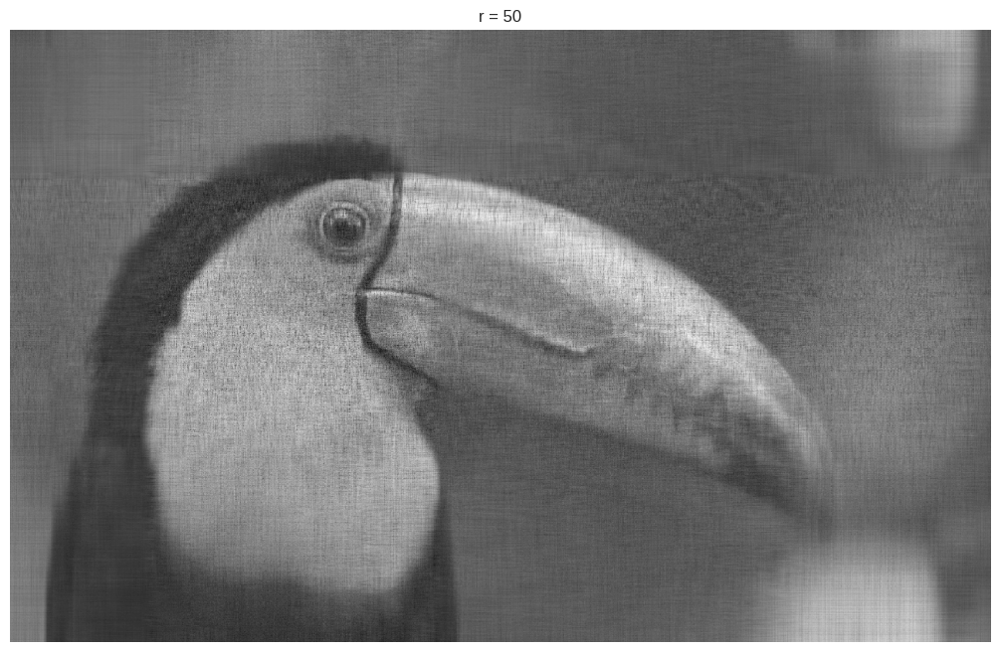

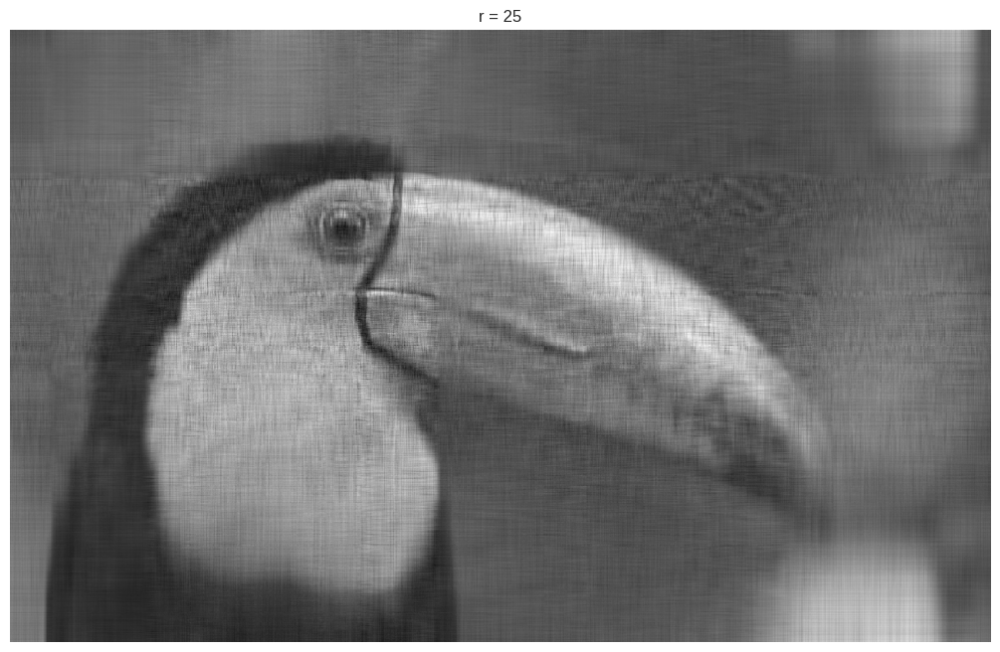

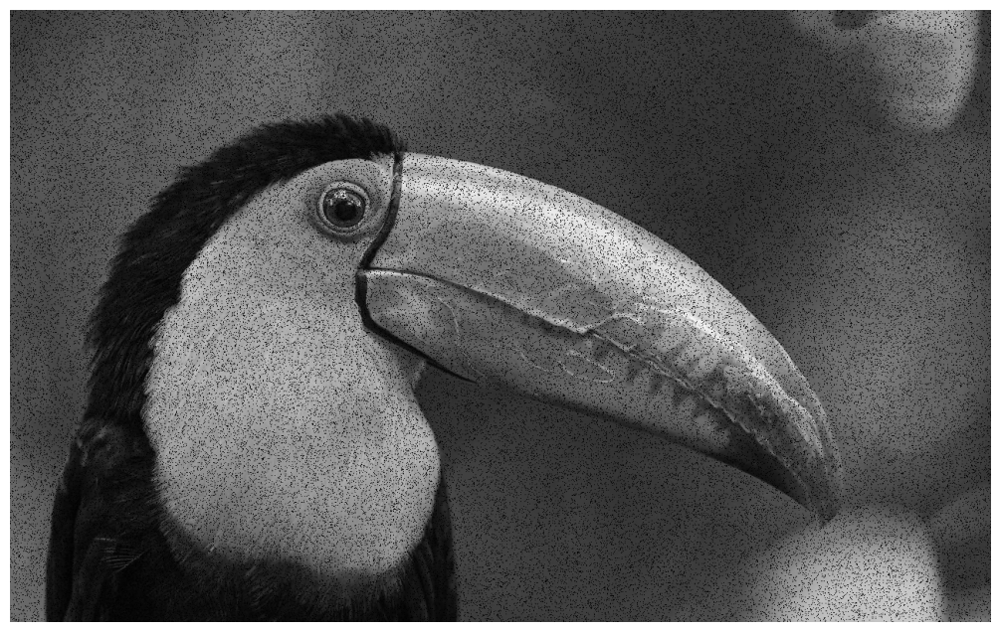

In [113]:
#removing sault and pepper noise
U1, S1, VT1 = np.linalg.svd(noisy_image_sp,full_matrices=False)
S1 = np.diag(S1)

j = 0
for r in (50 ,25 ):
    Xapprox1 = U1[:,:r] @ S1[0:r,:r] @ VT1[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox1)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()
img_3 = plt.imshow(noisy_image_sp)
img_3.set_cmap('gray')
plt.axis('off')
plt.show()


In [114]:
psnr = []
for r in range(5 , 200 , 5):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    psnr.append(PSNR(noisy_image_sp , Xapprox))

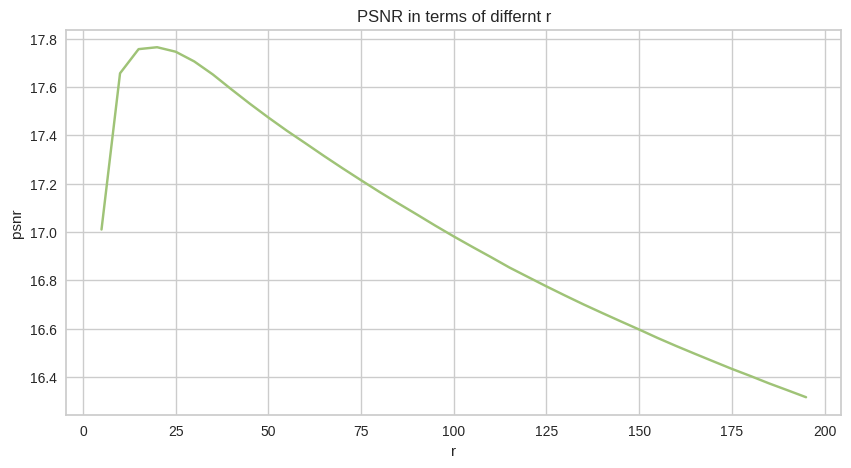

In [115]:
plt.figure(figsize=(10,5))
plt.plot(range(5 , 200 , 5) , psnr , color = 'g')
plt.xlabel('r')
plt.ylabel('psnr')
plt.title('PSNR in terms of differnt r')
plt.show()

##  Q3. PCA and Clustering <sub><sup>``(40 pt.)``</sup></sub>
In this problem we want to cluster some data points.
But first, you should reduce the number of features by the PCA algorithm then use kmeans clustering algorithm

In [179]:
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score as sil, calinski_harabasz_score as chs, silhouette_samples

### Import Dataset

In [180]:
Datapoint = pd.read_csv('Datapoint.csv')


### Correlation Heatmap

In this part plot the correlation Heatmap of features.
what is your suggestion about the number of principal components that they have high variance? Explain why.

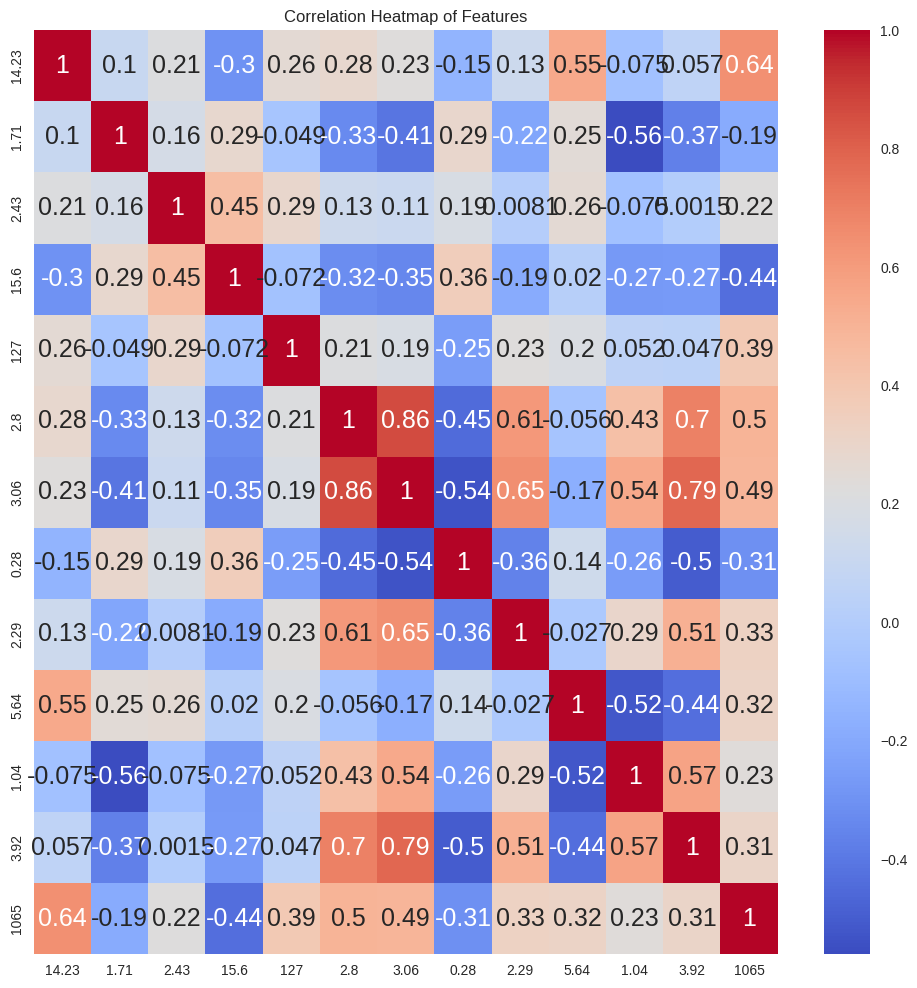

In [198]:
##Your Code start here
correlation = Datapoint.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Features')
plt.show()
##Your Code ends here

We should choose  the number of principal components that have considerable portion of the overall variance in the dataset. we can keep the components that have 80% or more of the variance.

###  Data Preprocessing

In [199]:
Datapoint.head()

,14.23,1.71,2.43,15.6,127,2.8,3.06,0.28,2.29,5.64,1.04,3.92,1065
0,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
2,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
3,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
4,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450


### PCA (Principal Component Analysis)
> As you know for applying PCA we should scale our data points.Here we use MinMax and Standard Scaler.
(First, use Standard Scaler)

Calculate principal components and plot Explained variance by each component.

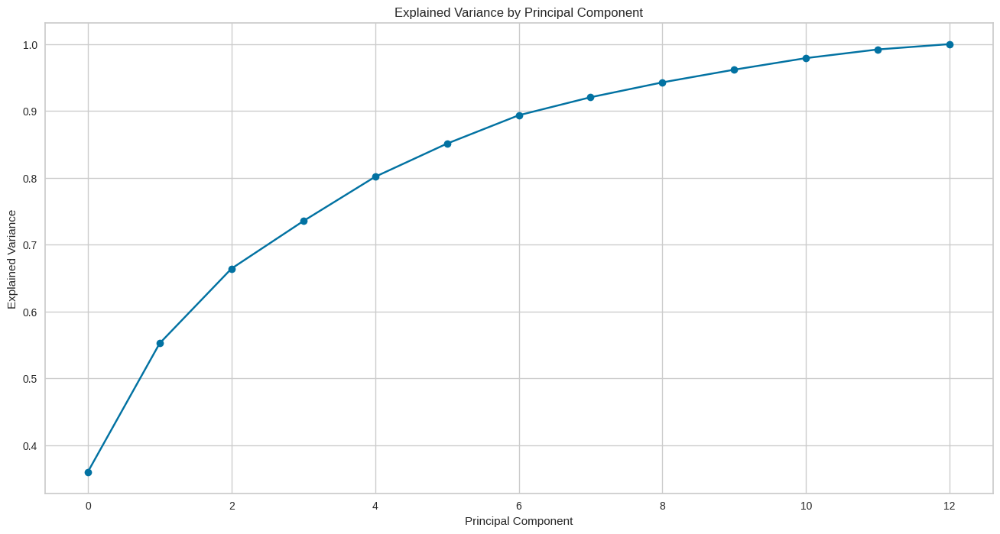

In [200]:
##Your Code start here
import numpy as np
import matplotlib.pyplot as plt
mean_vec = np.mean(Datapoint, axis=0)
std_dev_values = np.std(Datapoint, axis=0)
X_centered = (Datapoint - mean_vec)/std_dev_values
cov_matrix = np.cov(X_centered, rowvar=False)
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
idx = eigenvalues.argsort()[::-1]
eigenvalues = eigenvalues[idx]
eigenvectors = eigenvectors[:, idx]
explained_variance = eigenvalues / np.sum(eigenvalues)
result = np.cumsum(explained_variance)
pca_std_datapoint = explained_variance
plt.plot(np.arange(0, len(result) ), result, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Explained Variance by Principal Component')
plt.show()
##Your Code ends here

Apply PCA Algorithm from scratch and reduce the number of features to the number you have guessed in previous parts.

In [201]:
k = 3
top_eigenvectors = eigenvectors[:, :k]
X_pca = np.dot(X_centered, top_eigenvectors)
pca_std_datapoint = X_pca

### PCA plot in 2D
Plot data points using their two first features.What do you think about the number of clusters?

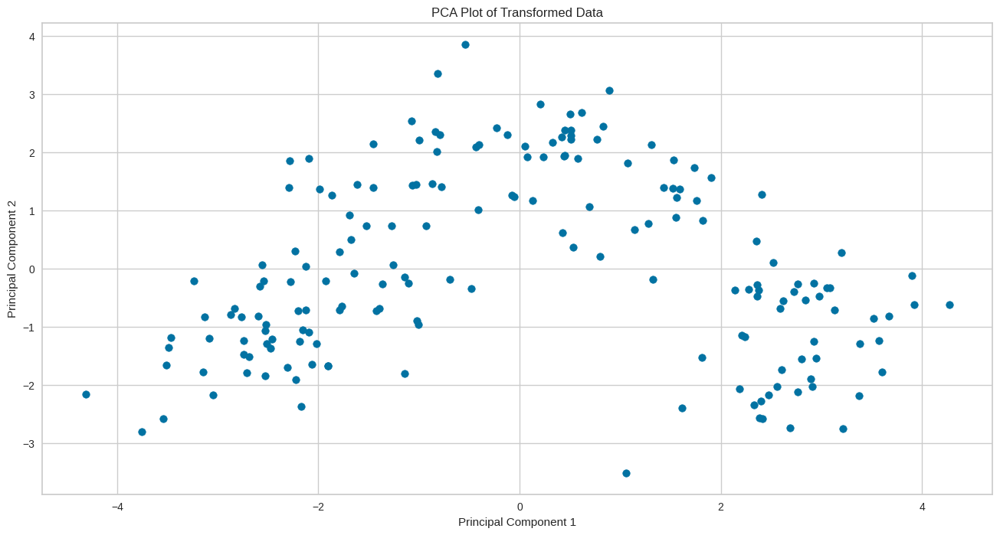

In [202]:
plt.figure()
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot of Transformed Data')
plt.show()

The number of clusters can be estimated based on this visual inspection. 3 clusters would be suitable.

### Do all previous steps for MinMax Scaling
Tell your opinion about diffrences.




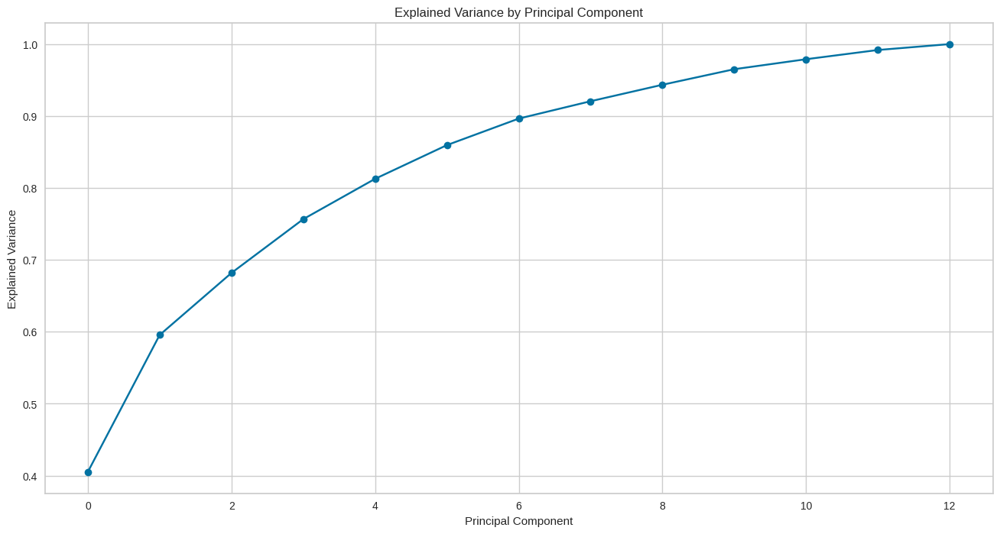

In [203]:
##Your Code start here
import numpy as np
import matplotlib.pyplot as plt
X = Datapoint
min_vals = np.min(X, axis=0)
max_vals = np.max(X, axis=0)
X_scaled = (X - min_vals) / (max_vals - min_vals)
mean_vec = np.mean(X_scaled, axis=0)
X_centered_2 = X_scaled - mean_vec
cov_matrix = np.cov(X_centered_2, rowvar=False)
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
idx = eigenvalues.argsort()[::-1]
eigenvalues = eigenvalues[idx]
eigenvectors = eigenvectors[:, idx]
explained_variance_2 = eigenvalues / np.sum(eigenvalues)
result_2 = np.cumsum(explained_variance_2)
plt.plot(np.arange(0, len(result_2)), result_2, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Explained Variance by Principal Component')
plt.show()
##Your Code ends here

In MinMax starting value is higher  but at the end both will reach 1

In [204]:
k = 3
top_eigenvectors = eigenvectors[:, :k]
X_pca_2 = np.dot(X_centered, top_eigenvectors)
pca_std_datapoint_2 = X_pca_2
##Your Code ends here

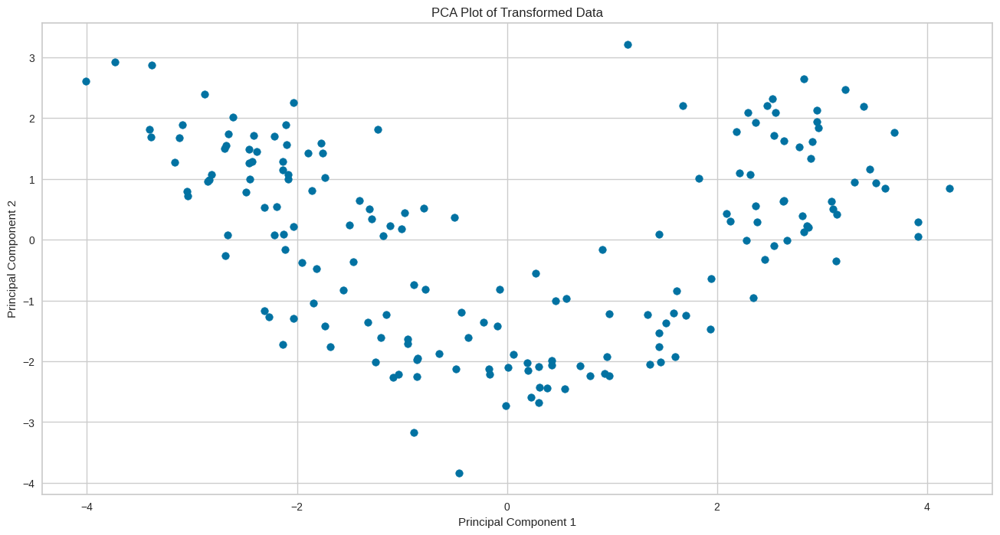

In [205]:
##Your Code start here
plt.figure()
plt.scatter(X_pca_2[:, 0], X_pca_2[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot of Transformed Data')
plt.show()
##Your Code ends here

### KMeans Clustering
#### Elbow Method for Determining Cluster Amount on  Dataset

Using the elbow method to find the optimal number of clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Text(0.5, 1.0, 'Elbow curve')

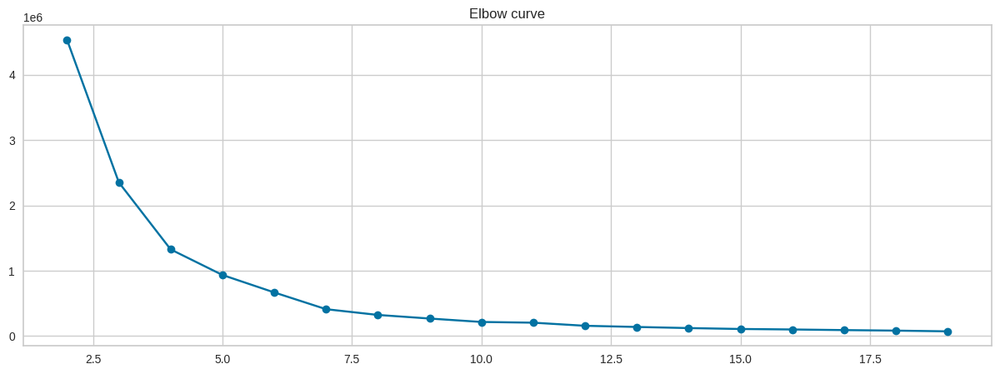

In [206]:
##Your Code start here
X = Datapoint
distorsions = []
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 20), distorsions, marker='o')
plt.grid(True)
plt.title('Elbow curve')
##Your Code ends here

the optimum number is 3 based on the figure

What is inertia and silhouette metrics?
Explain them briefly.





Inertia: Inertia, also known as within-cluster sum of squares (WCSS), is a measure of how internally coherent the clusters are. It calculates the sum of squared distances of samples to their closest cluster center. A lower inertia value indicates that the clusters are more compact and well-separated, which is generally desirable. However, inertia alone may not be sufficient to determine the optimal number of clusters, as it tends to decrease as the number of clusters increases. This is where the "elbow method" can be used to find an optimal number of clusters based on the rate of decrease in inertia.

Silhouette Score: The silhouette score is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). It ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. A higher silhouette score suggests that the clusters are well-separated and that the objects within the same cluster are similar to each other. The silhouette score can be used to evaluate the quality of clustering when the ground truth about the data is not available. In summary, inertia measures the compactness of clusters, while the silhouette score measures both the compactness and separation of clusters. These metrics are often used to assess the performance of clustering algorithms and to determine the optimal number of clusters for a given dataset.

In [208]:
#You should save your final datapoints in pca_std_datapoint variable
inertia = []
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter= 500, random_state=17)
    kmeans.fit(pca_std_datapoint)
    inertia.append(kmeans.inertia_)

100%|██████████| 8/8 [00:02<00:00,  2.76it/s]


In [209]:
silhouette = {}
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter=500, random_state=17)
    kmeans.fit(pca_std_datapoint)
    silhouette[i] = sil(pca_std_datapoint, kmeans.labels_, metric='euclidean')

100%|██████████| 8/8 [00:00<00:00, 13.75it/s]


Plot the **inertia** and **silhouette ** values

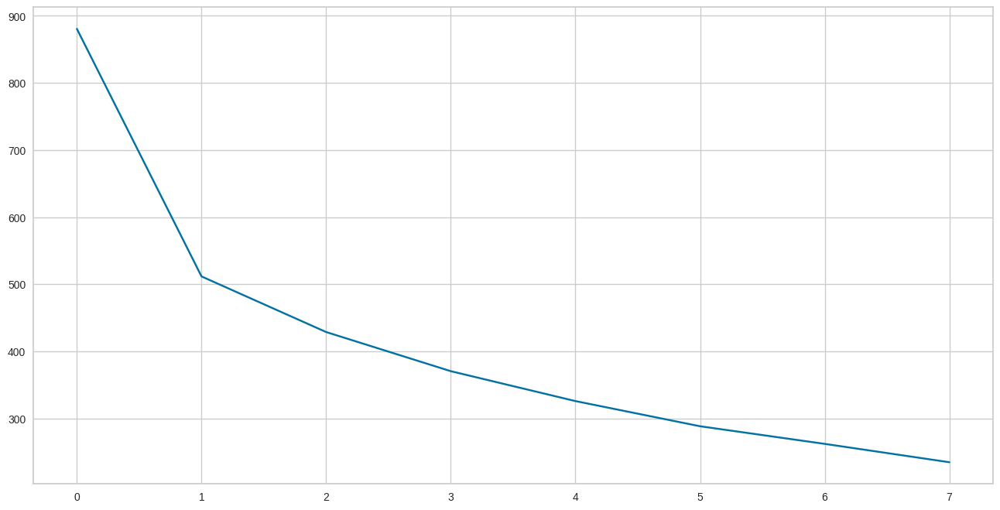

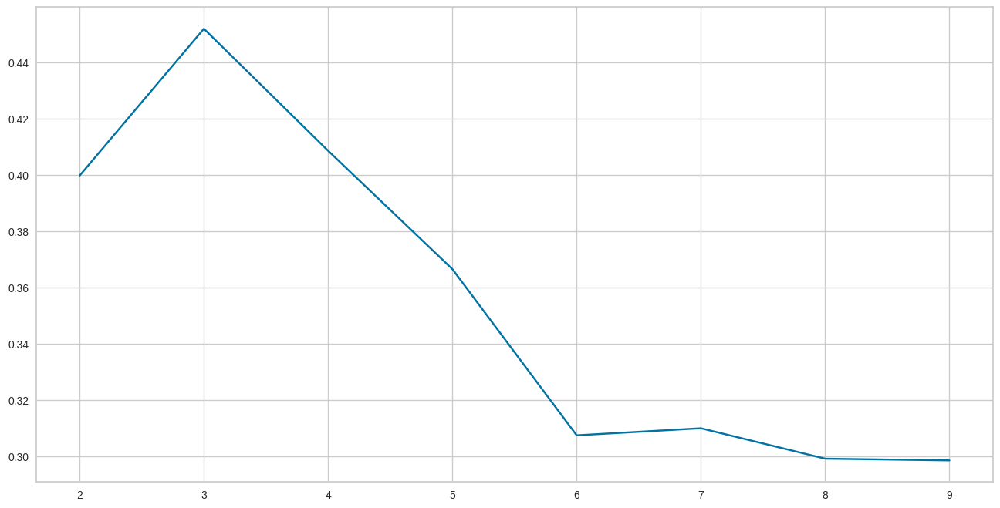

dict_keys([2, 3, 4, 5, 6, 7, 8, 9])


In [210]:
##Your Code start here
plt.plot(np.arange(0, len(inertia)), inertia )
plt.show()
plt.plot(silhouette.keys(), silhouette.values() )
plt.show()
print(silhouette.keys())
##Your Code ends here

Tune the hyper parameters based on your conclusions.

In [211]:
model_kmeans = KMeans(n_clusters=3, random_state=0, init='k-means++')
y_predict_kmeans1 = model_kmeans.fit_predict(pca_std_datapoint)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


#Now plot the datapoints usig two first features
(Each cluster in a different colour)

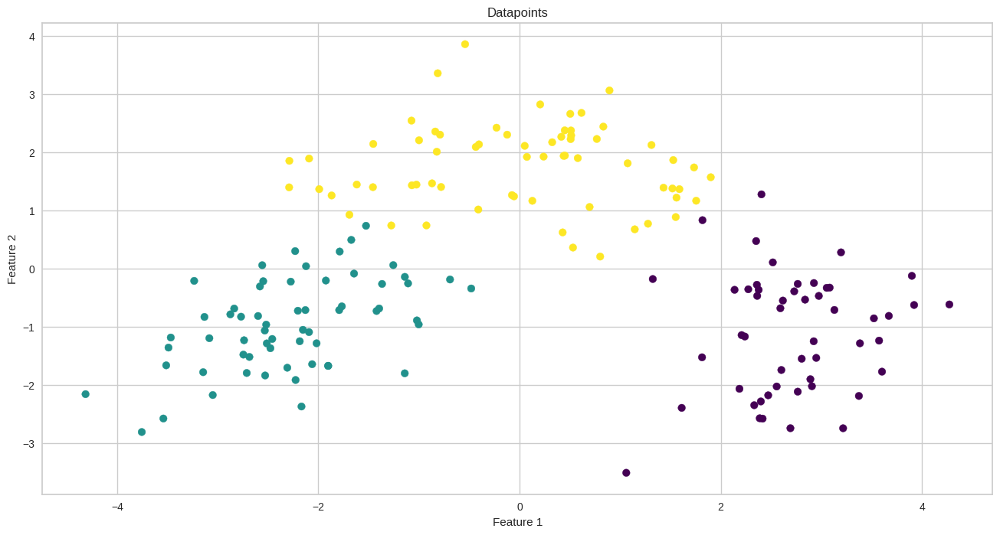

In [212]:
plt.scatter(pca_std_datapoint[:, 0], pca_std_datapoint[:, 1] , c= y_predict_kmeans1 , cmap='viridis')
plt.title('Datapoints')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

plt.show()


Do all previous steps for MinMax scaled data points.





In [213]:
#You should save your final datapoints in pca_std_datapoint variable
inertia_2 = []
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter= 500, random_state=17)
    kmeans.fit(pca_std_datapoint_2)
    inertia_2.append(kmeans.inertia_)

100%|██████████| 8/8 [00:00<00:00, 33.83it/s]


In [214]:
silhouette_2 = {}
for i in tqdm(range(2,10)):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter=500, random_state=17)
    kmeans.fit(pca_std_datapoint_2)
    silhouette_2[i] = sil(pca_std_datapoint_2, kmeans.labels_, metric='euclidean')

100%|██████████| 8/8 [00:01<00:00,  5.95it/s]


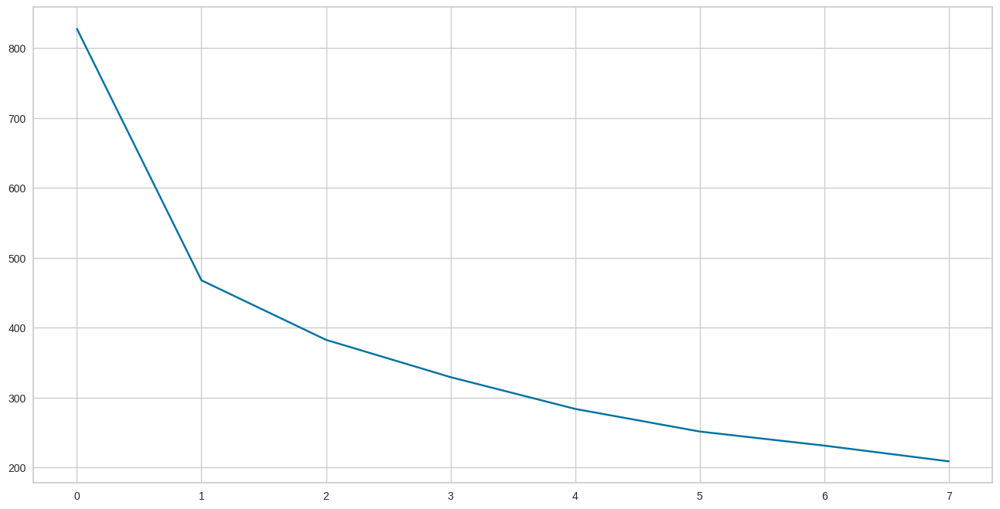

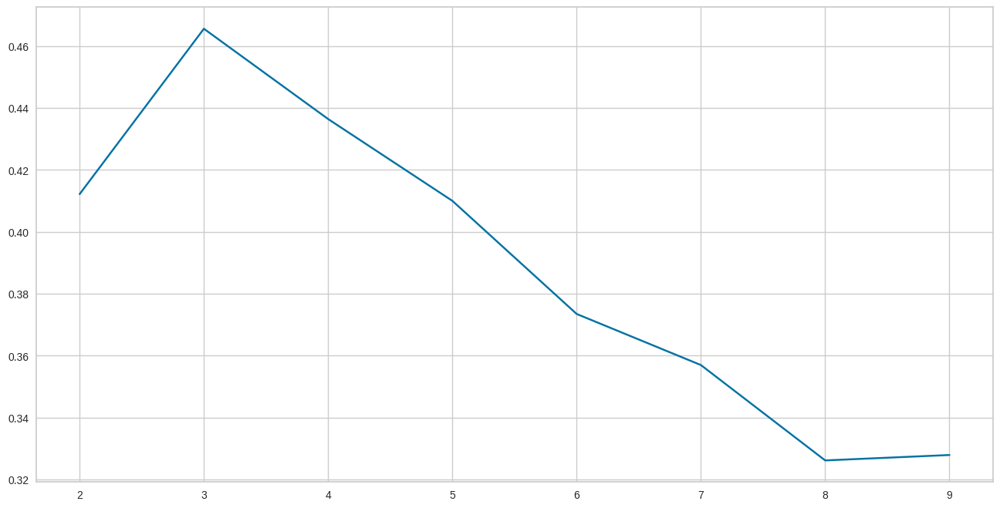

In [215]:
##Your Code start here
plt.plot(np.arange(0, len(inertia_2)), inertia_2 )
plt.show()
plt.plot(silhouette_2.keys(), silhouette_2.values() )
plt.show()
##Your Code ends here

In [216]:
model_kmeans = KMeans(n_clusters=3, random_state=0, init='k-means++')
y_predict_kmeans2 = model_kmeans.fit_predict(pca_std_datapoint_2)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


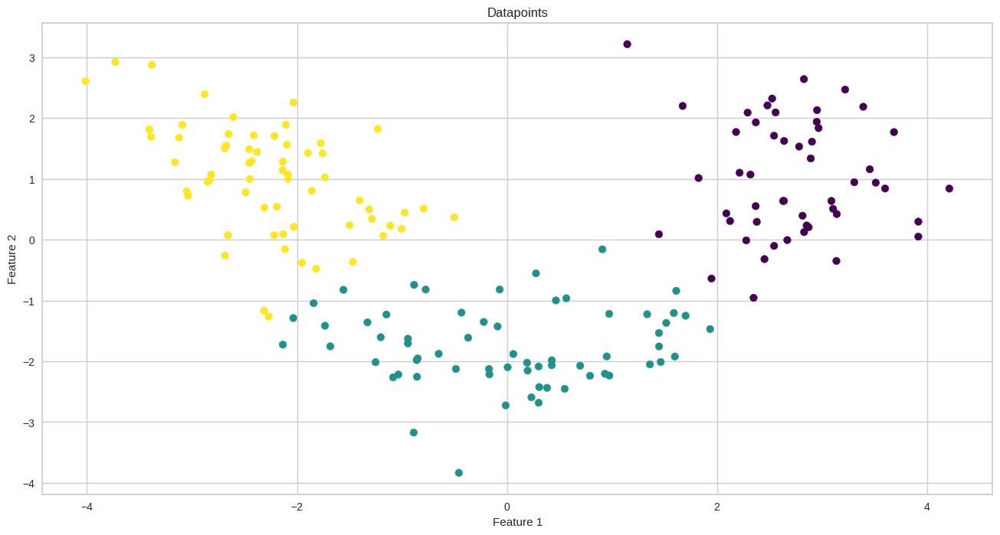

In [217]:
plt.scatter(pca_std_datapoint_2[:, 0], pca_std_datapoint_2[:, 1] , c= y_predict_kmeans2 , cmap='viridis')
plt.title('Datapoints')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

plt.show()


Compare the results of different scaling methods in a PCA problem

The  difference between these two method is in the data normalizing. MinMax scaling rescales the data to a specific range, while Standard scaling standardizes the data to have zero mean and unit variance.